# Imports

In [ ]:
import numpy as np
from numpy import linalg as la
import pandas as pd
import matplotlib.pyplot as plt
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

import seaborn as sns

from sklearn.svm import SVC

import time

import os
import sys

from warnings import filterwarnings
filterwarnings('ignore')

# Use in VS Code
# from load_data import load_data

## Run only in Colab

In [ ]:
# Only in Colab
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Only in Colab
# Set the folder path to the root of the datasets in this folder.
folder_path = '/content/drive/MyDrive/folder/path/to/datasets'
assert os.path.exists(folder_path), "Root folder path does not exist"

In [ ]:
# Run only in Colab

sys.path.append(folder_path)
from load_data import load_data

## Load the data

In [ ]:
start_time = time.time()

dataset2_path = os.path.join(folder_path, "./dataset2.csv")
X_original, Y = load_data(dataset2_path)

end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed Time: {elapsed_time} seconds")

Elapsed Time: 45.779383182525635 seconds


In [ ]:
start_time = time.time()

blind_dataset2_path = os.path.join(folder_path, "./blind_test2.csv")
X_blind_original, _ = load_data(blind_dataset2_path)

end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed Time: {elapsed_time} seconds")

Y is None
Elapsed Time: 4.042362689971924 seconds


## Convert Numpy array to Pandas DataFrame

In [ ]:
X_df = pd.DataFrame(X_original)

Y_df = pd.DataFrame(Y)

X_blind_df = pd.DataFrame(X_blind_original)

In [ ]:
X_df.head(5)

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,0.0,0.732924,0.000000,0.000000,0.0,0.000000,0.567167,0.033896,0.893174,0.000000,...,0.223419,0.572275,1.353723,0.0,0.731490,0.000000,0.205227,0.260115,0.0,0.000000
1,0.0,0.847137,1.062084,0.000000,0.0,0.000000,0.000000,0.050822,0.000000,0.000000,...,1.423398,0.478617,0.000000,0.0,0.453476,0.000000,0.000000,0.698493,0.0,0.000000
2,0.0,0.615394,0.786326,0.000000,0.0,0.000000,0.000000,0.125504,0.000000,0.000000,...,1.718917,0.900294,0.000000,0.0,0.085208,0.046996,0.000000,0.311104,0.0,0.000000
3,0.0,0.000000,0.000000,0.270019,0.0,0.000000,0.000000,0.000000,0.036148,1.125867,...,0.000000,0.635468,0.068453,0.0,1.124626,0.544661,0.000000,0.000000,0.0,0.379225
4,0.0,0.266321,0.874418,0.000000,0.0,0.085803,0.000000,0.000000,0.000000,2.201426,...,1.173947,0.000000,0.000000,0.0,1.331544,0.000000,0.000000,2.192485,0.0,0.000000


In [ ]:
X_blind_df.head(5)

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,0.0,0.449251,0.000000,1.393285,0.0,0.000000,0.158768,0.000000,1.670469,0.711235,...,0.481156,0.000000,1.261605,0.0,2.077002,0.131239,0.000000,0.000000,0.000000,0.000000
1,0.0,0.113263,0.651891,0.000000,0.0,0.753127,0.481613,0.000000,0.614155,0.600089,...,1.592974,0.727832,0.000000,0.0,0.000000,0.458703,0.000000,0.365902,0.802566,0.000000
2,0.0,0.152922,0.534327,0.023008,0.0,0.624780,0.377982,0.000000,0.476052,0.587950,...,1.644242,0.391862,0.000000,0.0,0.000000,0.543290,0.000000,0.410418,0.772320,0.000000
3,0.0,0.410344,0.204389,1.259326,0.0,0.000000,0.454337,0.484345,0.000000,0.000000,...,1.725227,0.000000,0.000000,0.0,0.000000,0.427657,0.000000,0.083923,1.096565,0.000000
4,0.0,0.564711,0.000000,0.000000,0.0,0.000000,0.849103,0.040693,0.625197,0.000000,...,0.111887,0.970089,1.229439,0.0,0.587792,0.281662,0.268051,0.000000,0.198165,0.103595


In [ ]:
X_df.describe()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
count,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,...,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000,50000.000000
mean,0.002555,0.412282,0.282929,0.862816,0.002432,0.164948,0.276602,0.105948,0.362772,0.391598,...,0.733189,0.350295,0.416468,0.025397,0.546334,0.231688,0.023067,0.292500,0.494801,0.044438
std,0.020458,0.338108,0.340408,0.850106,0.018763,0.325830,0.358520,0.172365,0.481772,0.529711,...,0.623234,0.453221,0.522895,0.102485,0.559384,0.332165,0.086678,0.510723,0.540758,0.105634
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.120745,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.150381,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.361327,0.121600,0.749885,0.000000,0.000000,0.062842,0.000000,0.000000,0.114606,...,0.622926,0.152308,0.045805,0.000000,0.450136,0.078395,0.000000,0.049510,0.270011,0.000000
75%,0.000000,0.648788,0.527817,1.537771,0.000000,0.141491,0.538662,0.164443,0.747399,0.671410,...,1.200056,0.586862,0.835609,0.000000,0.907499,0.341449,0.000000,0.312119,0.963547,0.000000
max,0.772366,1.656413,1.638322,4.155111,0.515648,2.056603,1.696396,0.942804,2.271916,2.946120,...,2.839278,2.840887,2.081210,1.377929,3.177271,1.994922,0.826040,2.895559,2.398213,0.887255


In [ ]:
X_blind_df.describe()

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,...,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,0.002522,0.413066,0.281168,0.842140,0.002448,0.158953,0.276874,0.106806,0.358168,0.386451,...,0.730696,0.346784,0.418438,0.023154,0.541380,0.225702,0.023124,0.293444,0.485643,0.040923
std,0.019615,0.335553,0.337656,0.838952,0.019184,0.319220,0.355572,0.172439,0.469204,0.520845,...,0.615603,0.447035,0.519154,0.099328,0.542455,0.324449,0.087599,0.506053,0.535328,0.100716
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.129119,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.161930,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.360359,0.126832,0.706543,0.000000,0.000000,0.072076,0.000000,0.000000,0.125198,...,0.628699,0.156422,0.088549,0.000000,0.457654,0.076217,0.000000,0.053096,0.263844,0.000000
75%,0.000000,0.642854,0.520034,1.487594,0.000000,0.121735,0.519447,0.168011,0.728354,0.649105,...,1.196591,0.569124,0.829813,0.000000,0.888912,0.330590,0.000000,0.322351,0.925593,0.000000
max,0.377169,1.527348,1.568351,3.915028,0.401689,1.832983,1.544632,0.888165,2.318142,2.823508,...,2.719666,2.580317,1.955655,1.045004,3.055264,1.857832,0.762358,2.701624,2.180935,0.961170


## Check non numeric values

In [ ]:
# Count the number of NaN values in each column
X_nan_counts = X_df.isna().sum(axis=0) # shape (ncols,)
X_blind_nan_counts = X_df.isna().sum(axis=0)

# Count the number of null values in each column
X_null_counts = X_df.isnull().sum(axis=0)
X_blind_null_counts = X_df.isnull().sum(axis=0)

print(f"X_nan_counts: {X_nan_counts.sum()} \tX_blind_nan_counts: {X_blind_nan_counts.sum()}")
print(f"X_null_counts: {X_null_counts.sum()} \tX_blind_null_counts: {X_blind_null_counts.sum()}")



X_nan_counts: 0 	X_blind_nan_counts: 0
X_null_counts: 0 	X_blind_null_counts: 0


In [ ]:
# Check for non-numeric values
# This will create a DataFrame where each element is True if the corresponding element in the
# original DataFrame is non-numeric, and False otherwise.
# non_numeric_check = X_df.applymap(lambda x: not pd.api.types.is_numeric_dtype(x))

# print( non_numeric_check.sum().sum() )
# non_numeric_check.iloc[:2,:5]


## Data Visualization

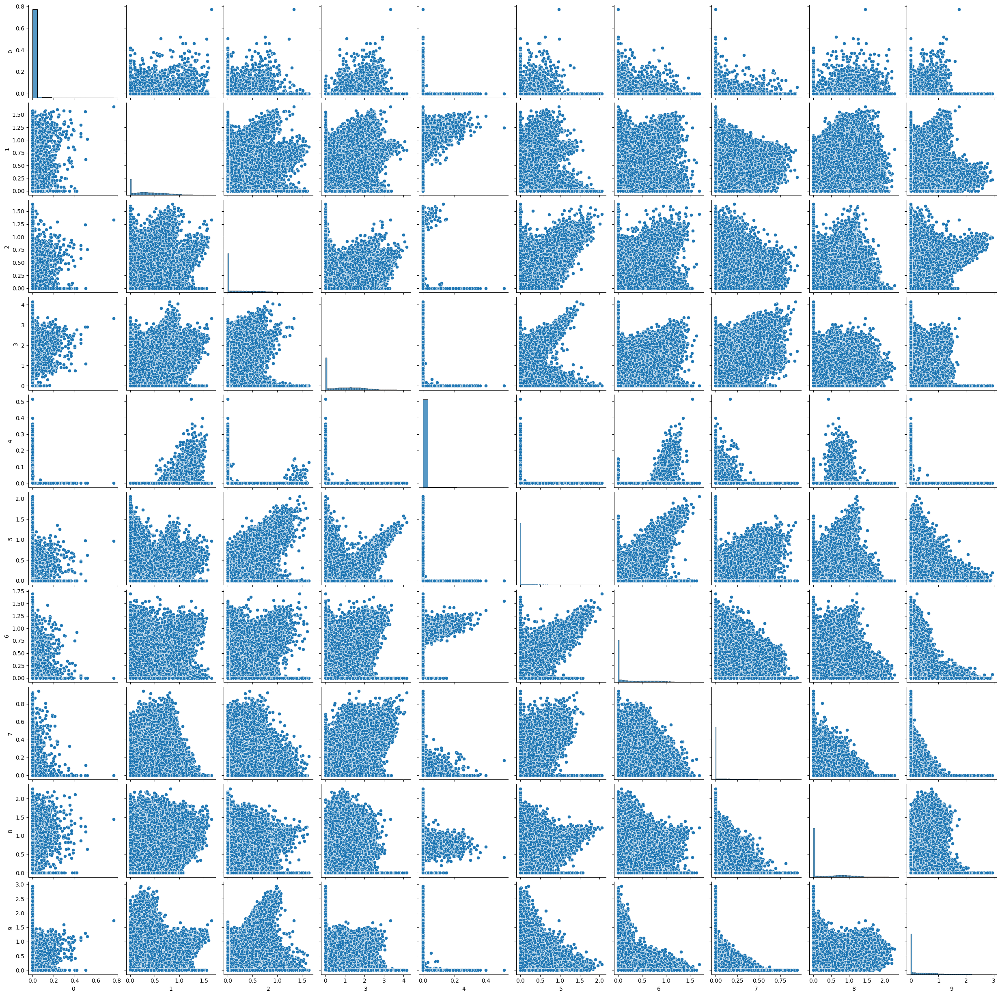

In [ ]:
sns.pairplot(X_df.iloc[:,:10])
plt.show()

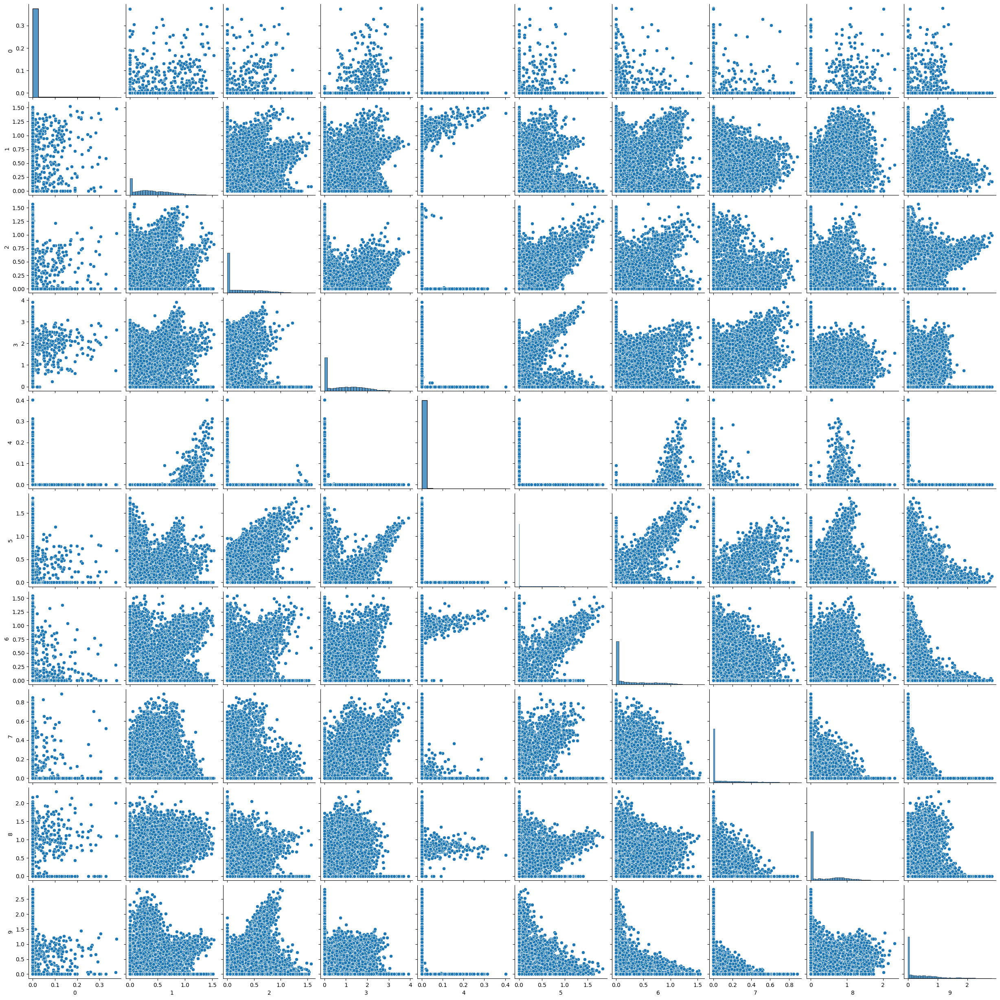

In [ ]:
sns.pairplot(X_blind_df.iloc[:,:10])
plt.show()

# Standardize the Data

In [ ]:
def standardise(X):
    # mean and standard deviation of all the features irrespective of class differences
    mean_all   = X.mean()
    std_all    = X.std()

    # standardised values
    X_standardised = (X-mean_all)/std_all
    return X_standardised

# X_standardised = standardise(X_original)
# X_standardised.head(10)

In [ ]:
scaler = StandardScaler()
scaler.fit(X_df)
X_standardised = scaler.transform(X_df)
X_blind_standardised = scaler.transform(X_blind_df)

In [ ]:
scaler.mean_.shape, scaler.var_.shape

((1000,), (1000,))

### Train, Test Split

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X_standardised, Y, stratify=Y, test_size=0.25, shuffle=True, random_state=2)
print(f"X_train shape: {X_train.shape} \tX_test shape: {X_test.shape} \tY_train shape: {Y_train.shape} \tX_blind_original shape: {X_blind_original.shape}")

# X_train, Y_train = (X_standardised, Y)
# print(f"X_train shape: {X_train.shape} \tY_train shape: {Y_train.shape} \tX_blind_original shape: {X_blind_original.shape}")

X_train shape: (37500, 1000) 	X_test shape: (12500, 1000) 	Y_train shape: (37500,) 	X_blind_original shape: (10000, 1000)


# Convert Numpy array to Pandas DataFrame

In [ ]:
X_train = pd.DataFrame(X_train)
# X_test = pd.DataFrame(X_test)

Y_train = pd.DataFrame(Y_train)
# Y_test = pd.DataFrame(Y_test)

X_blind_test = pd.DataFrame(X_blind_standardised)


In [ ]:
X_train.head(5)

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,10.303297,1.580531,0.404141,1.705708,-0.129624,0.126669,-0.610275,-0.61468,1.212251,1.396668,...,-1.176438,-0.772909,1.569155,6.799381,2.478236,-0.350359,-0.266128,-0.572723,-0.915023,1.849755
1,-0.124878,0.668823,-0.457319,1.024361,-0.129624,-0.007417,-0.512074,-0.61468,0.175446,0.060302,...,-0.642314,-0.772909,0.519567,-0.247818,0.404738,-0.064749,-0.266128,-0.572723,0.054249,-0.420680
2,-0.124878,-1.045175,-0.831155,-0.544041,-0.129624,-0.506245,-0.771520,-0.61468,1.345930,1.045726,...,-0.774891,-0.772909,0.755937,-0.247818,2.214825,-0.100823,-0.266128,-0.572723,-0.915023,1.888677
3,-0.124878,0.834849,2.769471,-1.014960,-0.129624,-0.506245,-0.771520,0.70578,-0.753001,-0.739275,...,1.526277,0.863856,-0.754511,-0.247818,-0.081154,-0.697517,-0.266128,0.476363,-0.915023,-0.420680
4,-0.124878,0.555051,2.778346,-1.014960,-0.129624,-0.506245,-0.771520,-0.61468,-0.753001,-0.318090,...,1.166463,1.065021,-0.796473,-0.247818,0.089896,-0.697517,-0.266128,0.918627,-0.915023,-0.420680


In [ ]:
X_blind_test.head(5)

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,-0.124878,0.109341,-0.831155,0.624010,-0.129624,-0.506245,-0.328672,-0.614680,2.714375,0.603424,...,-0.404400,-0.772909,1.616282,-0.247818,2.736373,-0.302412,-0.266128,-0.572723,-0.915023,-0.420680
1,-0.124878,-0.884399,1.083892,-1.014960,-0.129624,1.805187,0.571831,-0.614680,0.521794,0.393598,...,1.379566,0.833018,-0.796473,-0.247818,-0.976679,0.683446,-0.266128,0.143724,0.569141,-0.420680
2,-0.124878,-0.767101,0.738526,-0.987895,-0.129624,1.411275,0.282776,-0.614680,0.235135,0.370682,...,1.461828,0.091716,-0.796473,-0.247818,-0.976679,0.938102,-0.266128,0.230887,0.513208,-0.420680
3,-0.124878,-0.005733,-0.230725,0.466429,-0.129624,-0.506245,0.495751,2.195350,-0.753001,-0.739275,...,1.591773,-0.772909,-0.796473,-0.247818,-0.976679,0.589980,-0.266128,-0.408399,1.112825,-0.420680
4,-0.124878,0.450833,-0.831155,-1.014960,-0.129624,-0.506245,1.596861,-0.378591,0.544714,-0.739275,...,-0.996910,1.367547,1.554766,-0.247818,0.074115,0.150449,2.826390,-0.572723,-0.548562,0.560027


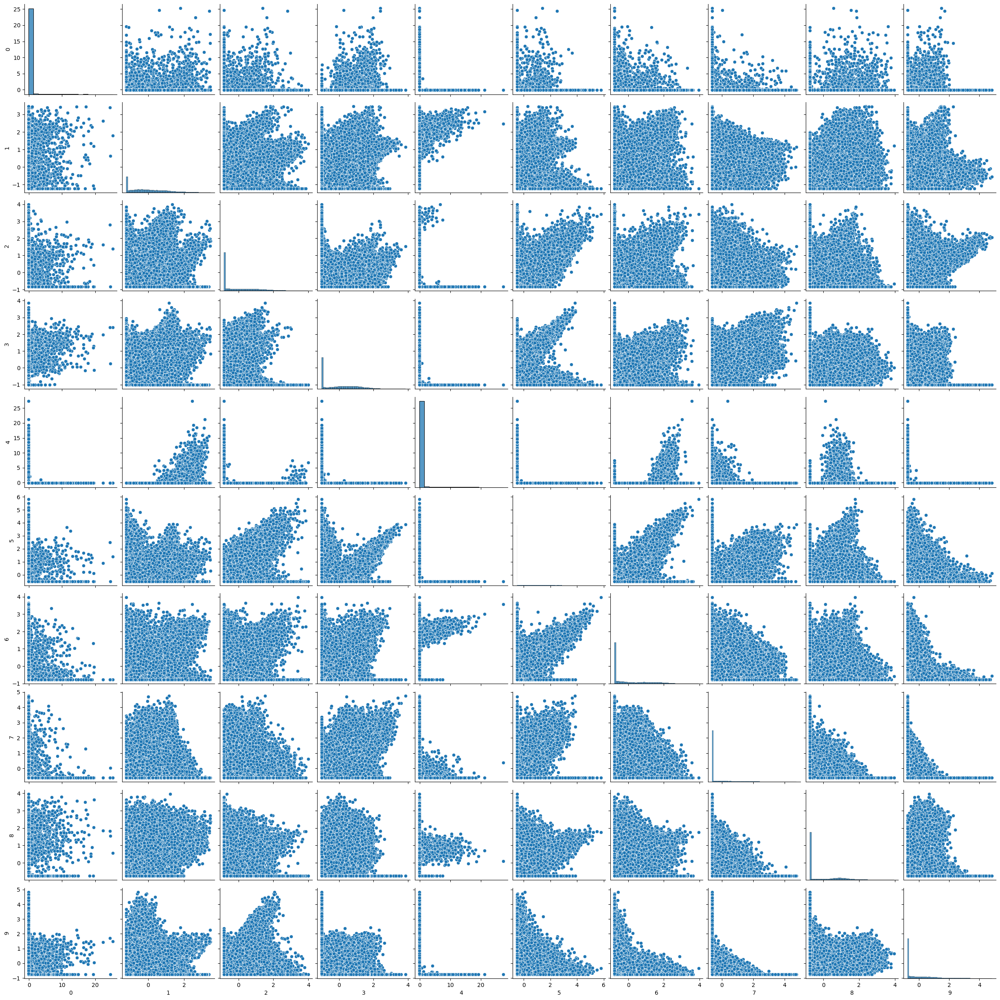

In [ ]:
sns.pairplot(X_train.iloc[:,:10])
plt.show()

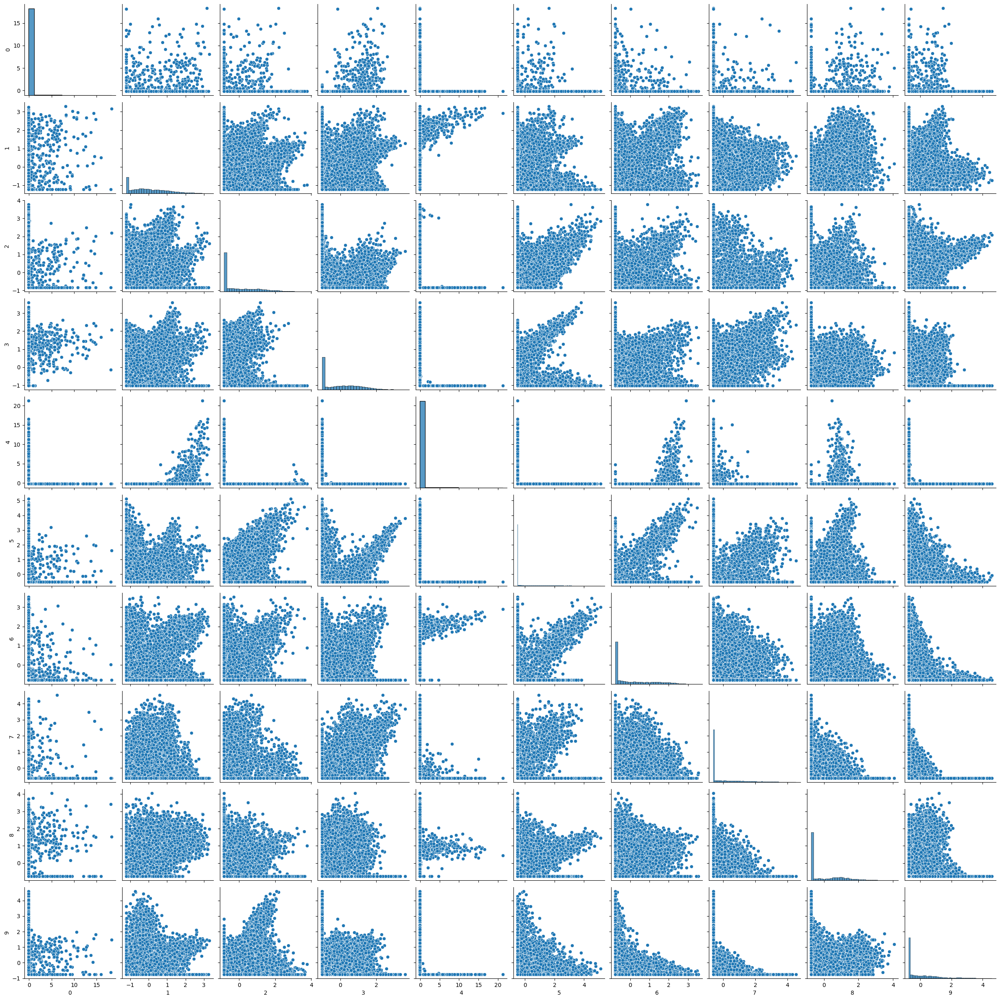

In [ ]:
sns.pairplot(X_blind_test.iloc[:,:10])
plt.show()

## Correlation Matrix

In [ ]:
start_time = time.time()

corr = X_train.corr()
print("Correlation shape: ", corr.shape)

# sample_size = 10
# corr = X_train.sample(sample_size).corr()

end_time = time.time()
elapsed_time = end_time - start_time
print(f"elapsed time: {elapsed_time}")


Correlation shape:  (1000, 1000)
elapsed time: 118.47109746932983


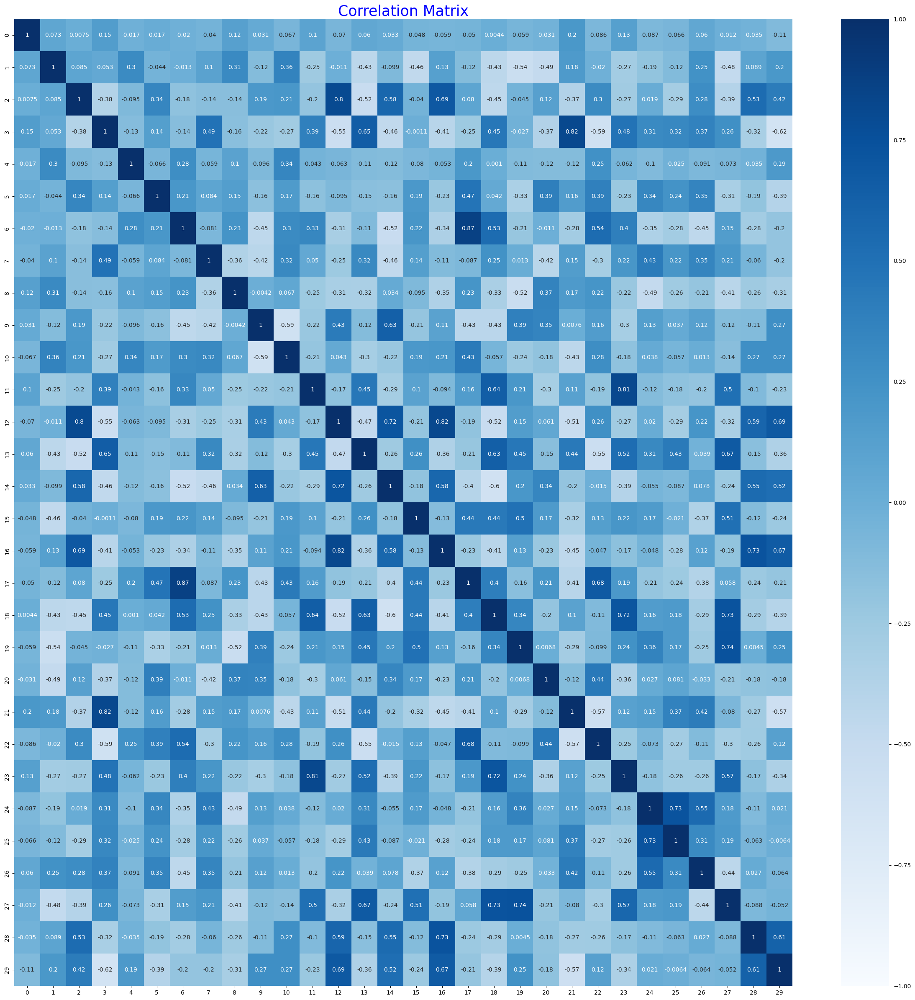

In [ ]:
corr_subset = corr.iloc[:30, :30]

ax, fig = plt.subplots(figsize = (30,30))
plt.title("Correlation Matrix", color="blue", fontsize=25)
sns.heatmap(corr_subset, vmin=-1, cmap=plt.cm.Blues, annot=True)
plt.show()

### Plot the Confusion Matrix and print the Classification Report and Accuracy Score

In [ ]:
labels = np.unique(Y)
labels = [str(elem) for elem in labels]

def confusion_matrix_score(ytest, ypred, labels=labels):

    score = accuracy_score(ytest, ypred) * 100
    print(f"\n\nThe accuracy score is {score:.2f}%.", end="\n\n")

    conf_matrix = confusion_matrix(ytest, ypred)

    sns.heatmap(conf_matrix, square=True, annot=True, fmt='d', cbar=True, lw=0.6,
                xticklabels=labels,
                yticklabels=labels)

    plt.title("Confusion Matrix", color="blue", fontsize=25)

    plt.xlabel('True Label')
    plt.ylabel('Predicted Label');

    # classification_report
    print(f"classification_report: \n{ classification_report(ytest, ypred, target_names=labels) }", end="\n\n")

## Save and load models

In [ ]:
import pickle

def save_model(model_name, fname):
    with open(fname, 'wb') as f:
        pickle.dump(model_name, f)

    print("The model is saved")

def load_model(fname):
    return pickle.load(open(fname,'rb'))



# Train

## Grid Search and Cross-validation for RBF and Sigmoid kernels

In [ ]:
param_grid = {'C':[10, 100], 'gamma':['scale', 'auto'], 'kernel':['rbf', 'sigmoid']}
grid = GridSearchCV(SVC(), param_grid, refit = True, verbose=2, cv=3)
grid.fit(X_train, Y_train)

Fitting 3 folds for each of 8 candidates, totalling 24 fits
[CV] END ......................C=10, gamma=scale, kernel=rbf; total time= 1.0min
[CV] END ......................C=10, gamma=scale, kernel=rbf; total time= 1.0min
[CV] END ......................C=10, gamma=scale, kernel=rbf; total time= 1.0min
[CV] END ..................C=10, gamma=scale, kernel=sigmoid; total time=  23.9s
[CV] END ..................C=10, gamma=scale, kernel=sigmoid; total time=  23.0s
[CV] END ..................C=10, gamma=scale, kernel=sigmoid; total time=  22.1s
[CV] END .......................C=10, gamma=auto, kernel=rbf; total time=  58.7s
[CV] END .......................C=10, gamma=auto, kernel=rbf; total time= 1.0min
[CV] END .......................C=10, gamma=auto, kernel=rbf; total time=  57.3s
[CV] END ...................C=10, gamma=auto, kernel=sigmoid; total time=  22.5s
[CV] END ...................C=10, gamma=auto, kernel=sigmoid; total time=  23.2s
[CV] END ...................C=10, gamma=auto, ker

GridSearchCV(cv=3, estimator=SVC(),
             param_grid={'C': [10, 100], 'gamma': ['scale', 'auto'],
                         'kernel': ['rbf', 'sigmoid']},
             verbose=2)

Accuracy on Test Set: 0.9705


The accuracy score is 97.05%.

classification_report: 
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1250
           1       0.99      0.99      0.99      1250
           2       0.96      0.97      0.97      1250
           3       0.92      0.93      0.92      1250
           4       0.97      0.97      0.97      1250
           5       0.94      0.92      0.93      1250
           6       0.99      0.98      0.99      1250
           7       0.97      0.98      0.98      1250
           8       0.99      0.99      0.99      1250
           9       0.99      0.99      0.99      1250

    accuracy                           0.97     12500
   macro avg       0.97      0.97      0.97     12500
weighted avg       0.97      0.97      0.97     12500


Elapsed Time: 104.4986891746521
Cross-validated results:
{'mean_fit_time': array([25.00473507, 13.3771441 , 24.15484842, 13.18853219, 27.75946999,
       

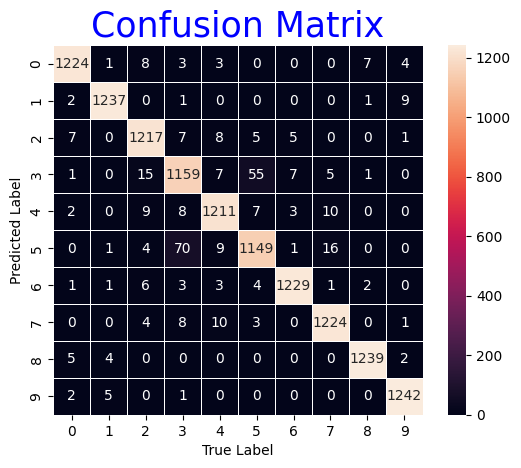

In [ ]:
# Get the best model
best_svm_model = grid.best_estimator_


start_time = time.time()

# Evaluate the best model on the test set
accuracy = best_svm_model.score(X_test, Y_test)
print(f"Accuracy on Test Set: {accuracy:.4f}")

Y_pred = best_svm_model.predict(X_test)
confusion_matrix_score(Y_test, Y_pred)

end_time = time.time()
elapsed_time = end_time - start_time
print(f"Elapsed Time: {elapsed_time}")


# You can also access other information, such as the cross-validated results
cv_results = grid.cv_results_
print("Cross-validated results:")
print(cv_results)


In [ ]:
# fname1 = os.path.join(folder_path, "best_model_v1.pkl")
# best_svm_model = load_model(fname1)

In [ ]:
# Save the best_model
fname1 = os.path.join(folder_path, "best_model_v1.pkl")
save_model(model_name=best_svm_model, fname=fname1)

start_time = time.time()

y_pred_svm = best_svm_model.predict(X_blind_test)

end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time: ", elapsed_time)

fname3 = os.path.join(folder_path, "blind_test_v1.pkl")
save_model(model_name=y_pred_svm, fname=fname3)

The model is saved
Elapsed time:  42.881555795669556
The model is saved


In [ ]:
df = pd.DataFrame(grid.cv_results_)
df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_gamma,param_kernel,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,25.004735,1.050580,37.009827,1.406520,10,scale,rbf,"{'C': 10, 'gamma': 'scale', 'kernel': 'rbf'}",0.97136,0.97056,0.97216,0.971360,0.000653,2
1,13.377144,0.454227,9.632312,0.485551,10,scale,sigmoid,"{'C': 10, 'gamma': 'scale', 'kernel': 'sigmoid'}",0.96352,0.96192,0.96096,0.962133,0.001056,6
2,24.154848,0.228670,34.689411,1.460022,10,auto,rbf,"{'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}",0.97144,0.97064,0.97224,0.971440,0.000653,1
3,13.188532,0.296111,9.475902,0.453240,10,auto,sigmoid,"{'C': 10, 'gamma': 'auto', 'kernel': 'sigmoid'}",0.96328,0.96216,0.96112,0.962187,0.000882,5
4,27.759470,0.536171,42.891144,1.270643,100,scale,rbf,"{'C': 100, 'gamma': 'scale', 'kernel': 'rbf'}",0.96464,0.96344,0.96376,0.963947,0.000507,4
5,11.646164,1.005962,7.146739,0.321285,100,scale,sigmoid,"{'C': 100, 'gamma': 'scale', 'kernel': 'sigmoid'}",0.95816,0.96080,0.95880,0.959253,0.001124,8
6,27.805652,0.317624,42.117170,1.932757,100,auto,rbf,"{'C': 100, 'gamma': 'auto', 'kernel': 'rbf'}",0.96480,0.96344,0.96392,0.964053,0.000563,3
7,10.781667,0.236947,7.434692,0.313958,100,auto,sigmoid,"{'C': 100, 'gamma': 'auto', 'kernel': 'sigmoid'}",0.95824,0.96104,0.95904,0.959440,0.001178,7


In [ ]:
print(f"grid.best_estimator_: {grid.best_estimator_}, \ngrid.best_params_: {grid.best_params_}, \ngrid.best_score_: {grid.best_score_}")

grid.best_estimator_: SVC(C=10, gamma='auto'), 
grid.best_params_: {'C': 10, 'gamma': 'auto', 'kernel': 'rbf'}, 
grid.best_score_: 0.97144


## Try single models. Note: computationally heavy!



The accuracy score is 10.36%.

classification_report: 
              precision    recall  f1-score   support

           0       1.00      0.00      0.00      1250
           1       1.00      0.02      0.04      1250
           2       0.00      0.00      0.00      1250
           3       1.00      0.00      0.00      1250
           4       1.00      0.00      0.01      1250
           5       1.00      0.00      0.00      1250
           6       1.00      0.01      0.01      1250
           7       1.00      0.00      0.00      1250
           8       1.00      0.00      0.00      1250
           9       0.10      1.00      0.18      1250

    accuracy                           0.10     12500
   macro avg       0.81      0.10      0.03     12500
weighted avg       0.81      0.10      0.03     12500


Elapsed time (sec):  2953.586817264557


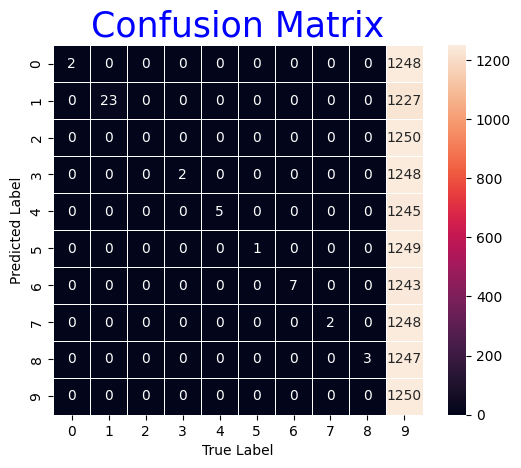

In [ ]:
start_time = time.time()

# Train a single SVC model
svc_rdf_c1 = SVC(kernel="rbf", C=1, gamma=1.0 )
svc_rdf_c1.fit(X_train, Y_train)
Y_pred = svc_rdf_c1.predict(X_test)
confusion_matrix_score(Y_test, Y_pred)

end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time (sec): ", elapsed_time)



The accuracy score is 36.63%.

classification_report: 
              precision    recall  f1-score   support

           0       0.24      0.30      0.27      1250
           1       0.25      0.27      0.26      1250
           2       0.33      0.45      0.38      1250
           3       0.35      0.44      0.39      1250
           4       0.38      0.45      0.41      1250
           5       0.32      0.28      0.30      1250
           6       0.68      0.52      0.59      1250
           7       0.41      0.21      0.27      1250
           8       0.66      0.30      0.41      1250
           9       0.34      0.45      0.39      1250

    accuracy                           0.37     12500
   macro avg       0.40      0.37      0.37     12500
weighted avg       0.40      0.37      0.37     12500


Elapsed time (sec):  631.9693984985352


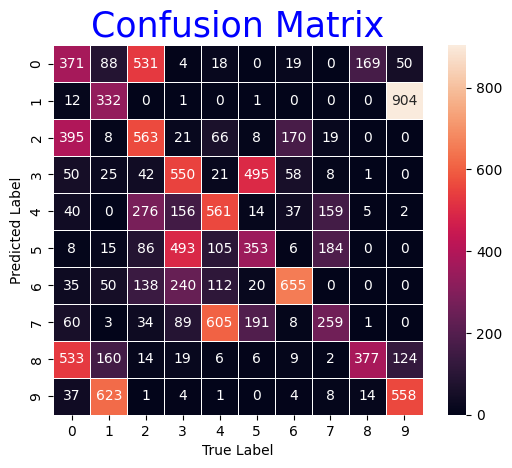

In [ ]:
start_time = time.time()

# Train a single SVC model
svc_sig_c1 = SVC(kernel="sigmoid", C=1, gamma=1.0 )
svc_sig_c1.fit(X_train, Y_train)
Y_pred = svc_sig_c1.predict(X_test)
confusion_matrix_score(Y_test, Y_pred)

end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time (sec): ", elapsed_time)



The accuracy score is 10.04%.

classification_report: 
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      1250
           1       1.00      0.00      0.00      1250
           2       0.00      0.00      0.00      1250
           3       0.00      0.00      0.00      1250
           4       0.00      0.00      0.00      1250
           5       1.00      0.00      0.00      1250
           6       1.00      0.00      0.00      1250
           7       1.00      0.00      0.00      1250
           8       1.00      0.00      0.00      1250
           9       0.10      1.00      0.18      1250

    accuracy                           0.10     12500
   macro avg       0.51      0.10      0.02     12500
weighted avg       0.51      0.10      0.02     12500


Elapsed time (sec):  2841.2277386188507


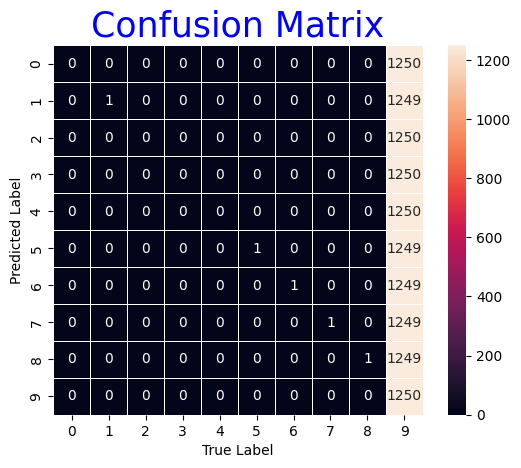

In [ ]:
start_time = time.time()

# Train a single SVC model
svc_rdf_c10 = SVC(kernel="rbf", C=10, gamma=10 )
svc_rdf_c10.fit(X_train, Y_train)
Y_pred = svc_rdf_c10.predict(X_test)
confusion_matrix_score(Y_test, Y_pred)

end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time (sec): ", elapsed_time)

### Best Performing Model so far!
svc = SVC(kernel="rbf", C=1, gamma="scale", )



The accuracy score is 97.20%.

classification_report: 
              precision    recall  f1-score   support

           0       0.99      0.98      0.99      1250
           1       0.99      0.99      0.99      1250
           2       0.96      0.98      0.97      1250
           3       0.92      0.93      0.93      1250
           4       0.97      0.97      0.97      1250
           5       0.95      0.92      0.93      1250
           6       0.99      0.98      0.99      1250
           7       0.97      0.98      0.98      1250
           8       0.99      0.99      0.99      1250
           9       0.99      0.99      0.99      1250

    accuracy                           0.97     12500
   macro avg       0.97      0.97      0.97     12500
weighted avg       0.97      0.97      0.97     12500


Elapsed time (sec):  120.62428879737854


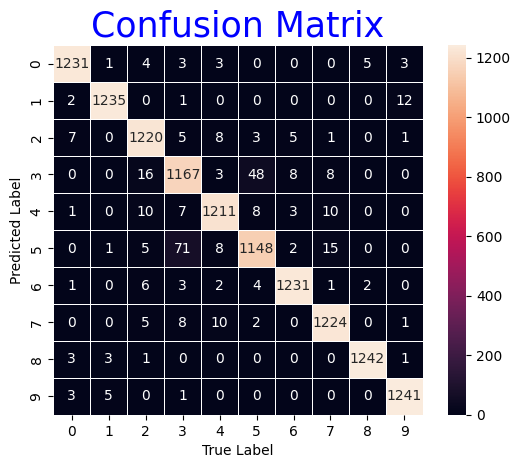

In [ ]:
start_time = time.time()

# Train a single SVC model
svc = SVC(kernel="rbf", C=1, gamma="scale", )
svc.fit(X_train, Y_train)
Y_pred = svc.predict(X_test)
confusion_matrix_score(Y_test, Y_pred)

end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time (sec): ", elapsed_time)

Since this is the best performing model so far, let's try Cross-validation with it to ensure that the results are stable and was not jsut lucky on that particular dataset.

In [ ]:
start_time = time.time()

clf = SVC(kernel="rbf", C=1, gamma="scale" )
scores = cross_val_score(clf, X_train, Y_train, cv=5)

end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time (sec): ", elapsed_time)

scores

Elapsed time (sec):  342.9431915283203


array([0.97266667, 0.97386667, 0.97146667, 0.9736    , 0.97533333])

The mean score and the standard deviation are hence given by:

In [ ]:
print("%0.4f accuracy with a standard deviation of %0.4f" % (scores.mean(), scores.std()))

0.9734 accuracy with a standard deviation of 0.0013


In [ ]:
best_model = os.path.join(folder_path, "best_model.pkl")
save_model(model_name=svc, fname=best_model)

start_time = time.time()

y_pred_best = svc.predict(X_blind_test)

end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time: ", elapsed_time)

blind_test_best = os.path.join(folder_path, "blind_test_best.pkl")
save_model(model_name=y_pred_best, fname=blind_test_best)

The model is saved
Elapsed time:  46.82519578933716
The model is saved


In [ ]:
blind_test_best_pkl = load_model(blind_test_best)
blind_test_best = pd.DataFrame(blind_test_best_pkl)

blind_test_best_csv = os.path.join(folder_path, "blind_test_best.csv")
blind_test_best.to_csv(f'{blind_test_best_csv}')

In [ ]:
blind_test_best.head(20).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,3,8,8,0,6,6,1,6,3,1,0,9,3,7,9,8,5,7,8,6


## Grid Search and Cross-validation for the Polynomial kernel

Fitting 3 folds for each of 6 candidates, totalling 18 fits
Best Parameters:  {'C': 10, 'degree': 3, 'kernel': 'poly'}
Accuracy on Test Set: 0.9706


The accuracy score is 97.06%.

classification_report: 
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1250
           1       0.99      0.99      0.99      1250
           2       0.97      0.97      0.97      1250
           3       0.91      0.94      0.92      1250
           4       0.97      0.97      0.97      1250
           5       0.94      0.91      0.93      1250
           6       0.99      0.98      0.98      1250
           7       0.97      0.98      0.98      1250
           8       0.99      0.99      0.99      1250
           9       0.99      0.99      0.99      1250

    accuracy                           0.97     12500
   macro avg       0.97      0.97      0.97     12500
weighted avg       0.97      0.97      0.97     12500


Elapsed time:  1874.115937948227


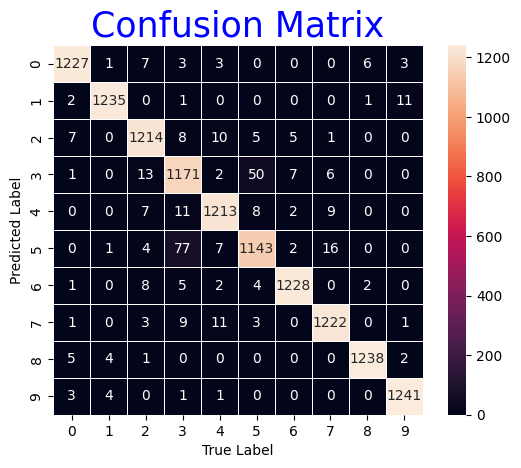

In [ ]:
start_time = time.time()

# Define the parameter grid to search
# param_grid = {
#     'C': [0.1, 1, 10],
#     'kernel': ['rbf', 'sigmoid'],
#     'gamma': [1, 0.1, 'scale'],
# }
param_grid = {
    'C':[1, 10],
    'degree':[3, 4, 5],
    'kernel':['poly']
    }

# Create the GridSearchCV object with 3-fold cross-validation
grid_search = GridSearchCV(SVC(), param_grid, cv=3, scoring='accuracy', refit=True, n_jobs=-1, verbose=2)

# Fit the model to the data
grid_search.fit(X_train, Y_train)

# Print the best parameters found by the grid search
print("Best Parameters: ", grid_search.best_params_)

# Get the best model
best_svm_polymodel = grid_search.best_estimator_

# Evaluate the best model on the test set
accuracy = best_svm_polymodel.score(X_test, Y_test)
print(f"Accuracy on Test Set: {accuracy:.4f}")

Y_predpoly = best_svm_polymodel.predict(X_test)
confusion_matrix_score(Y_test, Y_predpoly)

# You can also access other information, such as the cross-validated results
cv_results = grid_search.cv_results_
# print("Cross-validated results:")
# print(cv_results)

end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time: ", elapsed_time)


In [ ]:
fname2 = os.path.join(folder_path, "best_model_poly_v1.pkl")
save_model(model_name=best_svm_polymodel, fname=fname2)


The model is saved


In [ ]:
df = pd.DataFrame(cv_results)
df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_C,param_degree,param_kernel,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score
0,104.746063,0.838085,55.401628,2.090254,1,3,poly,"{'C': 1, 'degree': 3, 'kernel': 'poly'}",0.96976,0.97000,0.97120,0.970320,0.000630,2
1,175.225010,0.770712,74.187569,0.931219,1,4,poly,"{'C': 1, 'degree': 4, 'kernel': 'poly'}",0.95432,0.95536,0.95960,0.956427,0.002284,5
2,258.339731,2.289120,98.369546,1.322390,1,5,poly,"{'C': 1, 'degree': 5, 'kernel': 'poly'}",0.92272,0.92384,0.92880,0.925120,0.002642,6
3,53.475822,0.394455,38.880293,1.412372,10,3,poly,"{'C': 10, 'degree': 3, 'kernel': 'poly'}",0.97288,0.97136,0.97360,0.972613,0.000934,1
4,82.889883,1.961443,49.871847,1.426062,10,4,poly,"{'C': 10, 'degree': 4, 'kernel': 'poly'}",0.97016,0.96896,0.97048,0.969867,0.000654,3
5,119.407791,0.610622,51.076756,12.596276,10,5,poly,"{'C': 10, 'degree': 5, 'kernel': 'poly'}",0.96032,0.96136,0.96360,0.961760,0.001369,4


In [ ]:
print(f"best_svm_polymodel: {best_svm_polymodel}, \ngrid_search.best_params_: {grid_search.best_params_}, \ngrid_search.best_score_: {grid_search.best_score_}")

best_svm_polymodel: SVC(C=10, kernel='poly'), 
grid_search.best_params_: {'C': 10, 'degree': 3, 'kernel': 'poly'}, 
grid_search.best_score_: 0.9726133333333333


In [ ]:
start_time = time.time()

y_pred_poly = best_svm_polymodel.predict(X_blind_test)

end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time: ", elapsed_time)

fname4 = os.path.join(folder_path, "blind_test_poly_v1.pkl")
save_model(model_name=y_pred_poly, fname=fname4)


Elapsed time:  22.06260585784912
The model is saved


---
---
---

# Gaussian Naive Bayes

In [ ]:
from sklearn.naive_bayes import GaussianNB
gnb = GaussianNB()


Fitting 10 folds for each of 6 candidates, totalling 60 fits
Best Parameters:  {'var_smoothing': 1e-07}
Accuracy on Test Set: 0.9668


The accuracy score is 96.68%.

classification_report: 
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1250
           1       0.99      0.98      0.99      1250
           2       0.96      0.97      0.96      1250
           3       0.89      0.94      0.92      1250
           4       0.97      0.97      0.97      1250
           5       0.96      0.89      0.92      1250
           6       0.99      0.98      0.98      1250
           7       0.97      0.98      0.97      1250
           8       0.99      0.99      0.99      1250
           9       0.98      0.99      0.98      1250

    accuracy                           0.97     12500
   macro avg       0.97      0.97      0.97     12500
weighted avg       0.97      0.97      0.97     12500


Elapsed time:  53.72991371154785


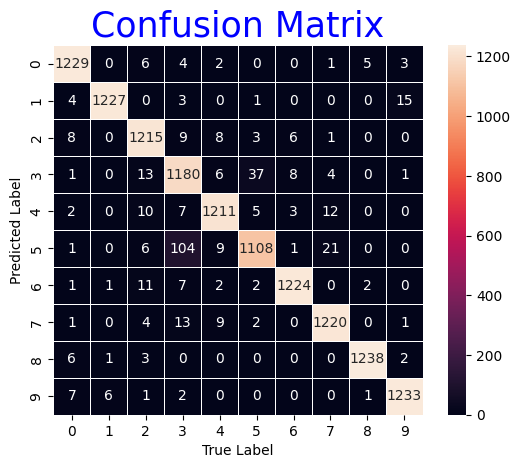

In [ ]:
start_time = time.time()

# Define the parameter grid to search
params_gnb = {'var_smoothing': [1e-11, 1e-10, 1e-9, 1e-8, 1e-7, 1e-6]}
# params_gnb = {'var_smoothing': np.logspace(0,-9, num=10)}


# Create the GridSearchCV object with 3-fold cross-validation
grid_search_gnb = GridSearchCV(gnb, params_gnb, cv=10, scoring='accuracy', refit=True, n_jobs=-1, verbose=2)

# Fit the model to the data
grid_search_gnb.fit(X_train, Y_train)

# Print the best parameters found by the grid search
print("Best Parameters: ", grid_search_gnb.best_params_)

# Get the best model
best_gnb_model = grid_search_gnb.best_estimator_

# Evaluate the best model on the test set
accuracy = best_gnb_model.score(X_test, Y_test)
print(f"Accuracy on Test Set: {accuracy:.4f}")

Y_pred_gnb = best_gnb_model.predict(X_test)
confusion_matrix_score(Y_test, Y_pred_gnb)

# You can also access other information, such as the cross-validated results
cv_results = grid_search_gnb.cv_results_
# print("Cross-validated results:")
# print(cv_results)

end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time: ", elapsed_time)


In [ ]:
fname_gnb1 = os.path.join(folder_path, "best_model_gnb_v1.pkl")
save_model(model_name=best_gnb_model, fname=fname_gnb1)


The model is saved


In [ ]:
df = pd.DataFrame(cv_results)
df

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_var_smoothing,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,split5_test_score,split6_test_score,split7_test_score,split8_test_score,split9_test_score,mean_test_score,std_test_score,rank_test_score
0,1.179895,0.302910,0.570126,0.105917,0.0,{'var_smoothing': 1e-11},0.969067,0.965067,0.964000,0.975200,0.967200,0.967733,0.967733,0.966667,0.967467,0.972000,0.968213,0.003098,6
1,0.888847,0.012942,0.499232,0.059716,0.0,{'var_smoothing': 1e-10},0.969067,0.965067,0.964000,0.975200,0.967200,0.967733,0.968000,0.966667,0.967733,0.972267,0.968293,0.003122,5
2,1.198982,0.128557,0.569817,0.074482,0.0,{'var_smoothing': 1e-09},0.968800,0.966400,0.963733,0.974400,0.967467,0.967733,0.968267,0.966933,0.968533,0.972267,0.968453,0.002835,4
3,0.904750,0.015214,0.465572,0.007725,0.0,{'var_smoothing': 1e-08},0.968800,0.966667,0.964000,0.974400,0.967733,0.967733,0.968267,0.967467,0.968800,0.972800,0.968667,0.002813,3
4,1.107269,0.141091,0.571873,0.084393,0.0,{'var_smoothing': 1e-07},0.969067,0.967200,0.964267,0.975200,0.968000,0.966933,0.968000,0.967467,0.969600,0.972800,0.968853,0.002955,1
5,0.966898,0.166744,0.468208,0.074395,0.000001,{'var_smoothing': 1e-06},0.969600,0.967200,0.964533,0.974667,0.967733,0.967467,0.968000,0.967467,0.969067,0.972800,0.968853,0.002778,1


In [ ]:
print(f"best_gnb_model: {best_gnb_model}, \ngrid_search_gnb.best_params_: {grid_search_gnb.best_params_}, \ngrid_search_gnb.best_score_: {grid_search_gnb.best_score_}")

best_gnb_model: GaussianNB(var_smoothing=1e-07), 
grid_search_gnb.best_params_: {'var_smoothing': 1e-07}, 
grid_search_gnb.best_score_: 0.9688533333333332


In [ ]:
start_time = time.time()

y_pred_poly = best_gnb_model.predict(X_blind_test)

end_time = time.time()
elapsed_time = end_time - start_time
print("Elapsed time: ", elapsed_time)

fname_gnb2 = os.path.join(folder_path, "blind_test_gnb_v1.pkl")
save_model(model_name=y_pred_poly, fname=fname_gnb2)

Elapsed time:  0.9234452247619629
The model is saved
